# COGS 118A- Project Proposal

# Names


- Jota Yamaguchi(A15581388)
- David Wang(A16035204)
- Wei Zhong (A15568452)
- Josie Li (A15924327)
- Mary Kovic (A15292606)


# Abstract 
Music has become significantly more accessible with the introduction of music applications such as Spotify and Soundcloud. We are no longer limited to listening to the radio or having to buy and use CDs. These applications not only allow us to listen to music wherever and whenever, but it also allows us to see measurements of certain audio features determined by the app. In this project, we will be predicting the genre of a song based on these features given by the Spotify music application. Our dataset from kaggle contains 6917 songs, each with 23 features (shape of 6917 x 23). Some of these features are simple characteristics such as artist or date of release. There are also more complicated features that spotify has found a way to measure such as ‘danceability’ or ‘liveliness’. Most importantly, the first column/feature contains the genre of each song. This is the feature that we will be predicting using the remaining features. Our success will be determined by the percentage of accuracy of our model and how well it can classify each song to its correct genre.

# Background

Spotify has an enormous library of music, with more than 70 million tracks as of 2021 <a name="ref_1"></a>[<sup>[1]</sup>](https://backlinko.com/spotify-users). With such an expansive array of songs for users to choose from, relevant recommendations are integral to enhancing user experience.

Given features of a song, spotify users can be recommended music that more accurately represents their tastes. Furthermore, recommendations can include lesser known artists to curate a more diversified musical palette. Researchers at Spotify have been working at perfecting a recommendation system for users. They found that users were more satisfied when recommended music included less popular tracks or those that strayed from their usual genre <a name="ref_2"></a>[<sup>[2]</sup>](https://research.atspotify.com/shifting-consumption-towards-diverse-content-via-reinforcement-learning/).

There has been some success in predicting genre based on the waveform of the song<a name="ref_3"></a>[<sup>[3]</sup>](https://towardsdatascience.com/predicting-music-genres-using-waveform-features-5080e788eb64), but we aim to predict genre based on the qualitative characteristics of a song. These characteristics include (but are not limited to) “Danceability”, “Acousticness”, and “Energy” <a name="ref_4"></a>[<sup>[4]</sup>](https://medium.com/@boplantinga/what-do-spotifys-audio-features-tell-us-about-this-year-s-eurovision-song-contest-66ad188e112a).

Songs in particular genres can be distinguished by a particular style. Songs in the same genre will bear similar characteristics, form, and/or style <a name="ref_5"></a>[<sup>[5]</sup>](https://towardsdatascience.com/predicting-music-genres-using-waveform-features-5080e788eb64). Therefore, we hypothesize that the characteristics of a song (as indicated above) will predict the genre that the song falls under. Determining the genres of songs based on qualitative categories is a more intuitive approach to classification.

# Problem Statement

In our project, we will try to predict the genres of songs based on the 23 features provided to us by the dataset. Given the fact that genres are discrete categories, we assume that a classification supervised-ML model will be our solution. The majority of features are represented as either a numerical value, a binomial distribution, or booleans. This allows us to represent our classification mathematically. Furthermore, we will use percentage of accuracy to measure our model success. If our model is successful, it should be replicable with any song on spotify given the 23 features. 


# Data

Dataset #1
- Name : Spotify Genre Audio Features 
- Link : https://www.kaggle.com/datasets/naoh1092/spotify-genre-audio-features
- Size : 23 Variables and 6917 Observations
- Description : Dataset collected form using Spotify’s public API and “The sound of Spotify” playlists, the dataset contains some critical variables that we will be utilizing in my classification model such as instrumentalness, acousticness, tempo, etc. These variables are represented numerically from 0 to 1. We will utilized these values to measure and train a classification model that will correctly predict a song’s genre given these values. 
- Cleaning : Need to delete columns with variables that we will not use in our classification model such as song id, cover link, title, etc. All variables values we will utilize is already in the format of floats and if there is straggling data, it will need to be cleaned along with tidying the dataset. 


Genre
Artist
popularity
release_date
danceability
energy
key
loudness
mode
speechiness
acousticness
instrumentalness
liveness
valence
tempo
1959-1979 number of albums: 323
1980-1999 number of albums: 1390
2000-2021 number of albums: 5204


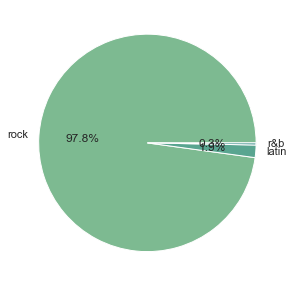

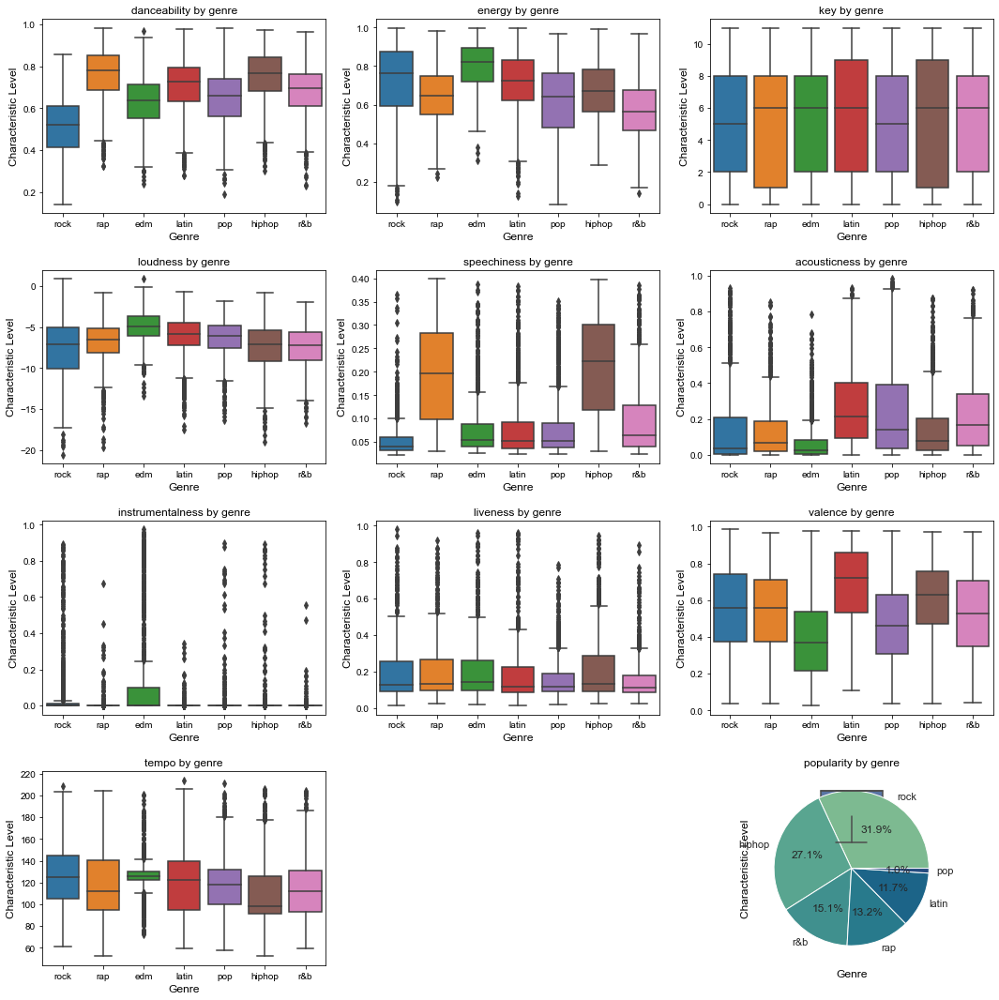

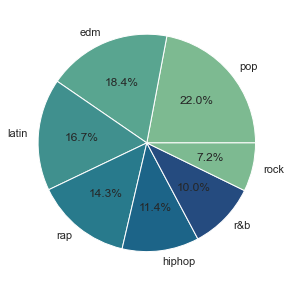

In [1]:
import pandas as pd
import seaborn as sns

df = pd.read_csv('spotify_genre_final.csv', encoding="ISO-8859-1")
df.head()

df.shape

#let's get rid of unnecessary columns.
df = df.drop(['Title', 'Album_cover_link', 'duration_ms', 'explicit', 'id', 'release_date_precision', 'total_tracks', 'time_signature'], axis=1)
df

df.isnull().values.any()

df.shape

for col in df.columns:
    print(col)

df['Genre'].unique()

sns.countplot(x='Genre', data=df)

import matplotlib.pyplot as plt


plt.rcParams['savefig.facecolor'] = "0.8"

def characteristics_plot(ax, characteristic):
    ax.set_xlabel('Genre', fontsize=12)
    ax.set_ylabel('Characteristic Level', fontsize=12)
    ax.set_title(characteristic + " by genre", fontsize=12)
    return 
            
plt.close('all')
fig = plt.figure()

fig.set_figheight(15)
fig.set_figwidth(15)

ax1 = plt.subplot2grid((4, 3), (0, 0))
ax1 = sns.boxplot(x='Genre', y='danceability', data=df)
ax2 = plt.subplot2grid((4, 3), (0, 1))
ax2 = sns.boxplot(x='Genre', y='energy', data=df)
ax3 = plt.subplot2grid((4, 3), (0, 2))
ax3 = sns.boxplot(x='Genre', y='key', data=df)
ax4 = plt.subplot2grid((4, 3), (1, 0))
ax4 = sns.boxplot(x='Genre', y='loudness', data=df)
ax5 = plt.subplot2grid((4, 3), (1, 1))
ax5 = sns.boxplot(x='Genre', y='speechiness', data=df)
ax6 = plt.subplot2grid((4, 3), (1, 2))
ax6 = sns.boxplot(x='Genre', y='acousticness', data=df)
ax7 = plt.subplot2grid((4, 3), (2, 0))
ax7 = sns.boxplot(x='Genre', y='instrumentalness', data=df)
ax8 = plt.subplot2grid((4, 3), (2, 1))
ax8 = sns.boxplot(x='Genre', y='liveness', data=df)
ax9 = plt.subplot2grid((4, 3), (2, 2))
ax9 = sns.boxplot(x='Genre', y='valence', data=df)
ax10 = plt.subplot2grid((4, 3), (3, 0))
ax10 = sns.boxplot(x='Genre', y='tempo', data=df)
ax11 = plt.subplot2grid((4, 3), (3, 2))
ax11 = sns.boxplot(x='Genre', y='popularity', data=df)

characteristics_plot(ax1, 'danceability')
characteristics_plot(ax2, 'energy')
characteristics_plot(ax3, 'key')
characteristics_plot(ax4, 'loudness')
characteristics_plot(ax5, 'speechiness')
characteristics_plot(ax6, 'acousticness')
characteristics_plot(ax7, 'instrumentalness')
characteristics_plot(ax8, 'liveness')
characteristics_plot(ax9, 'valence')
characteristics_plot(ax10, 'tempo')
characteristics_plot(ax11, 'popularity')

plt.tight_layout()

#Do most artists stick with a single genre?
count=df['Artist'].value_counts()

#get all albums made by an artist that has made more than 2 albums
df_artist=df[df['Artist'].isin(count.index[count.gt(2)])]
df_artist= df_artist.sort_values(by=['Artist']).reset_index()
df_artist_list=sorted(df_artist['Artist'].unique())
var_artist=[]
#for each artist, take the number of albums for the genre they made most albums of and divide by total amount of albums
for element in df_artist_list:
    tempdf=df_artist[df_artist['Artist'] == element]
    tempcount=tempdf['Genre'].value_counts()
    var_artist.append(tempcount[0]/sum(tempcount))


sns.set(rc={'figure.figsize':(5,5)})
sns.boxplot(y=var_artist)
#most artists stick with a single genre, but several brach out. The input test album gives artist name so it could help in classifying the album.

#how about time? Were some genres more popular in certain time frames?
#year cleanup
temp=df['release_date']
year1=pd.to_datetime(temp)
for i in range (year1.size):
    year1[i] =year1[i].year
df=df.assign(release_date=year1)


df['release_date'].value_counts().sort_index(ascending=False)
df1=df[df['release_date'] < 1980]
df2=df[df['release_date'] >= 1980]
df2=df2[df2['release_date'] < 2000]
df3=df[df['release_date'] >= 2000]
plt.figure(0)
ax01=plt.pie(df1['Genre'].value_counts(),labels=df1['Genre'].value_counts().index.tolist(),autopct='%1.1f%%',colors = sns.color_palette('crest'))
print("1959-1979 number of albums:" , df1['Genre'].value_counts().sum())
plt.figure(1)
ax02=plt.pie(df2['Genre'].value_counts(),labels=df2['Genre'].value_counts().index.tolist(),autopct='%1.1f%%',colors = sns.color_palette('crest'))
print("1980-1999 number of albums:" ,df2['Genre'].value_counts().sum())
plt.figure(2)
ax03=plt.pie(df3['Genre'].value_counts(),labels=df3['Genre'].value_counts().index.tolist(),autopct='%1.1f%%',colors = sns.color_palette('crest'))
print("2000-2021 number of albums:" , df3['Genre'].value_counts().sum())


# Proposed Solution

A solution to the problem is that we will be using a supervised classification algorithm similar to training a neural network to correctly predict a song’s genre given it’s values from variables in the dataset that will help us classify a song’s genre with these aspects. Using randomly assigned data split into epochs, can do a 9:1 split to training/testing data. Through the training data, we will measure the similarities between a combination of variables values that a certain genre of music has between the observations. Through testing, the algorithm will attempt to correctly classify a song’s genre, given the variables values of the song (values of its acousticness, dancibility, tempo, instrumentalness, etc.). Lastly, we will percent accuracy of the training and testing data of our classification model to measure it’s success if it’s replication with any song on spotify. 

# Preliminary Results

feature selection source: https://medium.com/nerd-for-tech/data-engineering-a-feature-selection-example-with-the-iris-dataset-11f0554e4b00. Since there are several datapoints, and the computation cost of using all datapoints is high, we performed feature selection to narrow down the number of features required for the model. We selected 6 features by the select K best technique and assessed the features with confusion matrices as well as pairplots.

In [2]:
df.describe()

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,6917.000000,6917.000000,6917.000000,6917.000000,6917.000000,6917.000000,6917.000000,6917.000000,6917.000000,6917.000000,6917.000000,6917.000000
mean,60.491543,0.663048,0.680214,5.348851,-6.725942,0.584357,0.111231,0.178805,0.034783,0.184376,0.538109,120.034788
std,12.944708,0.151653,0.173824,3.617507,2.783829,0.492868,0.096413,0.214174,0.138639,0.147764,0.233274,28.015297
min,0.000000,0.142000,0.084800,0.000000,-20.567000,0.000000,0.022400,0.000002,0.000000,0.013600,0.026000,52.145000
25%,53.000000,0.562000,0.562000,2.000000,-8.166000,0.000000,0.040600,0.020400,0.000000,0.091600,0.356000,96.571000
50%,62.000000,0.679000,0.696000,6.000000,-6.258000,1.000000,0.064500,0.088000,0.000002,0.125000,0.546000,120.010000
75%,69.000000,0.775000,0.818000,8.000000,-4.787000,1.000000,0.157000,0.261000,0.000470,0.236000,0.728000,136.029000
max,100.000000,0.983000,0.998000,11.000000,0.878000,1.000000,0.399000,0.983000,0.973000,0.979000,0.985000,214.025000


In [3]:
df['Genre'].value_counts()

pop       1161
rock      1136
latin     1036
hiphop     971
edm        956
rap        926
r&b        731
Name: Genre, dtype: int64

In [4]:
#convert genre to numerical
from sklearn.preprocessing import LabelEncoder

LE = LabelEncoder()
df['GenreNum'] = LE.fit_transform(df['Genre'])
LE.classes_

array(['edm', 'hiphop', 'latin', 'pop', 'r&b', 'rap', 'rock'],
      dtype=object)

In [5]:
df.head()
df = df.drop(columns=['Genre','Artist'])

In [6]:
df.head()

,popularity,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,GenreNum
0,75,1971,0.489,0.724,5,-8.367,1,0.0352,0.31300,0.185000,0.2870,0.150,117.292,6
1,78,1976,0.377,0.681,7,-8.039,1,0.0298,0.00088,0.002300,0.0504,0.285,108.789,6
2,76,1976,0.333,0.927,9,-8.550,0,0.0733,0.00290,0.000208,0.2970,0.385,141.466,6
3,78,1984,0.572,0.835,0,-6.219,1,0.0317,0.17100,0.000377,0.0702,0.795,129.981,6
4,79,1971,0.338,0.340,9,-12.049,0,0.0339,0.58000,0.003200,0.1160,0.197,82.433,6


In [7]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(df)
df_norm=scaler.transform(df)

# visualizing features and target
df_norm = pd.DataFrame(df_norm, columns = df.columns)



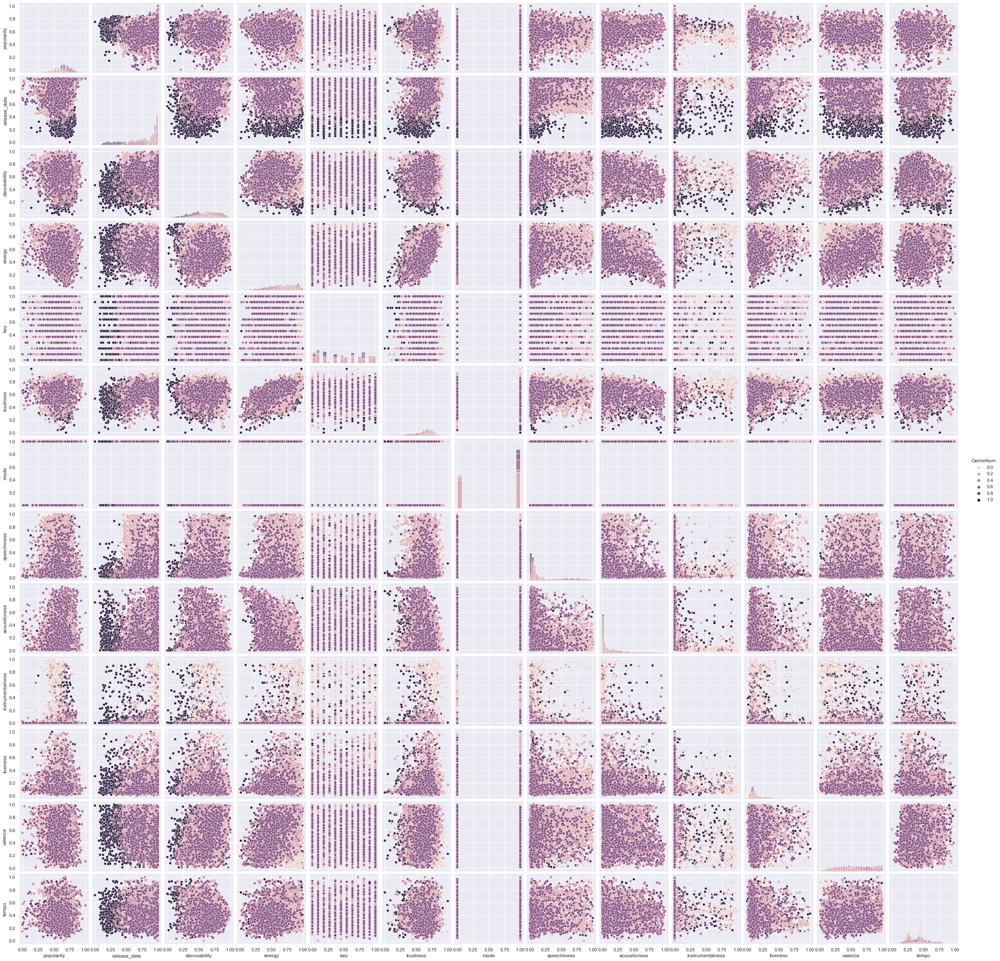

In [8]:
sns.pairplot(df_norm, hue = 'GenreNum', diag_kind='hist')

<AxesSubplot:>

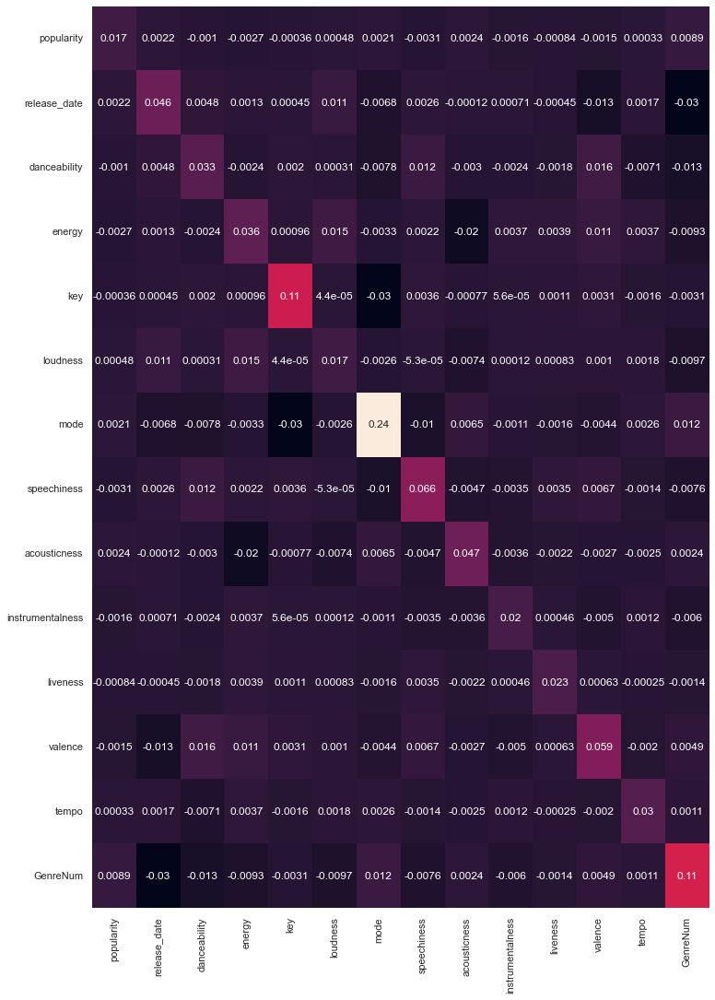

In [9]:
import matplotlib.pyplot as plt
df_cov = df_norm.cov()
plt.figure(figsize=(12, 18))
sns.heatmap(df_cov, annot = True, cbar = False)

In [10]:
target = df['GenreNum']
df_norm = df

from sklearn.feature_selection import SelectKBest, f_classif

selector = SelectKBest(score_func=f_classif, k=7)
selector.fit(df_norm, target)
cols = selector.get_support(indices=True)
df_trim = df_norm.iloc[:,cols]
print(selector.scores_)
print(selector.pvalues_)
print(df_trim.shape)

[180.98897792 842.78474147 443.20554679 200.64707366   2.50564097
 135.35891592  28.63826853 674.08380582 135.1803872  148.90041211
  16.57847999 181.61770577  45.12289853          inf]
[1.06488037e-214 0.00000000e+000 0.00000000e+000 1.35473115e-236
 2.00873684e-002 1.20936937e-162 5.01530354e-034 0.00000000e+000
 1.94844999e-162 2.82568074e-178 4.48624338e-019 2.09969473e-215
 1.85362325e-054 0.00000000e+000]
(6917, 7)


C:\Users\jyama\anaconda3\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:116: RuntimeWarning: divide by zero encountered in true_divide
  f = msb / msw


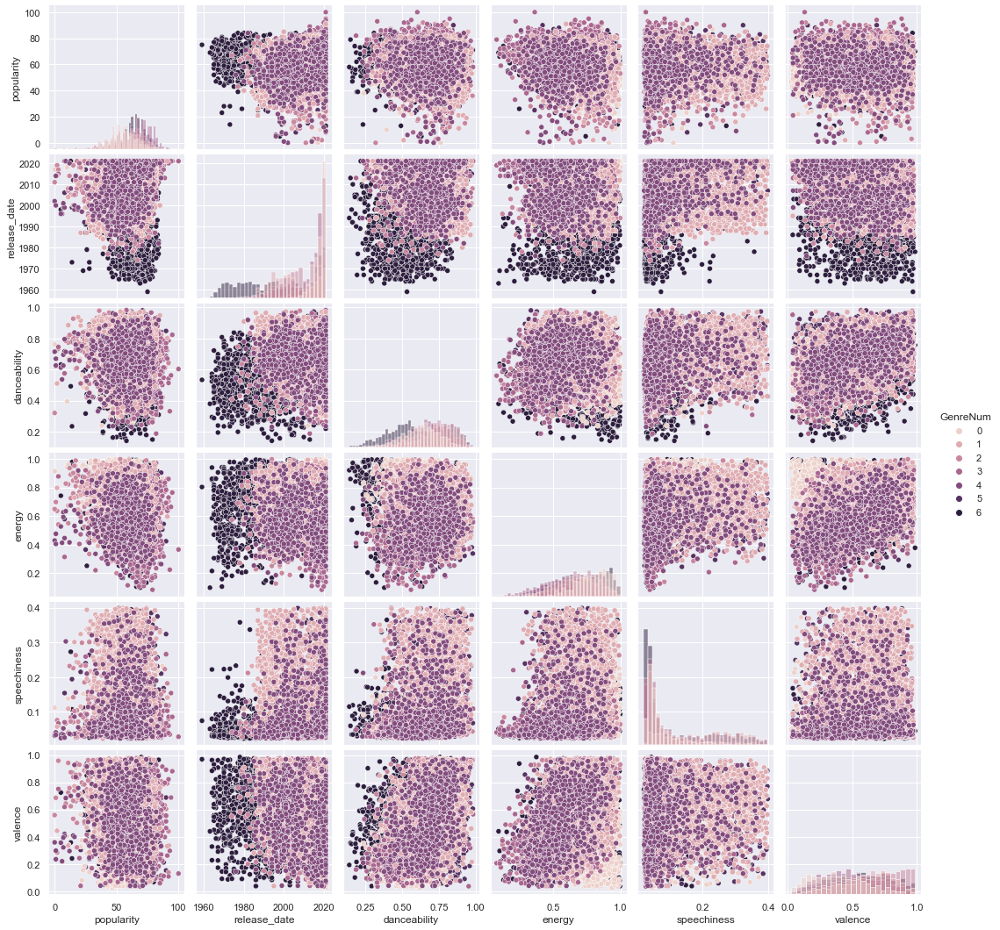

In [11]:
#plot pair plot again
sns.pairplot(df_trim, hue = 'GenreNum', diag_kind='hist')

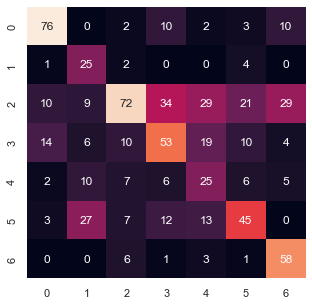

In [13]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix
def train_and_validate(X_train, X_test, y_train, y_test):
    mode = GaussianNB()    
    mode.fit(X_train, y_train);
    y_calc = mode.predict(X_test)
    y_prob = mode.predict_proba(X_test)
    mat = confusion_matrix(y_test, y_calc)
    sns.heatmap(mat.T, annot=True, cbar = False)
df_norm = df.drop(columns = ['GenreNum'])
X_train, X_test, y_train, y_test = train_test_split(df_norm, target, test_size = 0.10, stratify = None, random_state=0)
train_and_validate(X_train, X_test, y_train, y_test)

In [14]:
newdf = df_trim
newdf.head()

,popularity,release_date,danceability,energy,speechiness,valence,GenreNum
0,75,1971,0.489,0.724,0.0352,0.150,6
1,78,1976,0.377,0.681,0.0298,0.285,6
2,76,1976,0.333,0.927,0.0733,0.385,6
3,78,1984,0.572,0.835,0.0317,0.795,6
4,79,1971,0.338,0.340,0.0339,0.197,6


# Evaluation Metrics

To quantify the performance of our models, the simplest solution is to use the provided genres of the albums in our dataset to score the performance on a percentile basis of how many of the albums the model classified correctly. A confusion matrix would also help visualize the accuracy of our model.
Another method would be to use K-fold cross validation, shuffling then splitting the dataset into k groups, then iteratively using each group as a testing set to evaluate the temporary model fitted from the data from the other k-1 groups by way of the mean of performance estimates.


In [15]:
#split data into data and target
data = newdf.drop(columns = ['GenreNum'])
target = pd.DataFrame(newdf['GenreNum'])
data

,popularity,release_date,danceability,energy,speechiness,valence
0,75,1971,0.489,0.724,0.0352,0.150
1,78,1976,0.377,0.681,0.0298,0.285
2,76,1976,0.333,0.927,0.0733,0.385
3,78,1984,0.572,0.835,0.0317,0.795
4,79,1971,0.338,0.340,0.0339,0.197
...,...,...,...,...,...,...
6912,62,2020,0.571,0.431,0.0547,0.361
6913,1,2000,0.627,0.405,0.0335,0.298
6914,34,2012,0.507,0.832,0.2110,0.578
6915,46,2021,0.850,0.700,0.1310,0.740


In [16]:
#normalize data
data['popularity'] = (data['popularity'] - data['popularity'].min()) / (data['popularity'].max() - data['popularity'].min()) 
data['release_date'] = (data['release_date'] - data['release_date'].min()) / (data['release_date'].max() - data['release_date'].min()) 
data.head()

,popularity,release_date,danceability,energy,speechiness,valence
0,0.75,0.193548,0.489,0.724,0.0352,0.150
1,0.78,0.274194,0.377,0.681,0.0298,0.285
2,0.76,0.274194,0.333,0.927,0.0733,0.385
3,0.78,0.403226,0.572,0.835,0.0317,0.795
4,0.79,0.193548,0.338,0.340,0.0339,0.197


In [17]:
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.model_selection import KFold
from sklearn import tree
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier as RF
from sklearn.linear_model import LogisticRegression

#get the score of each model
def model_score(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    return model.score(X_test, y_test)
kf= KFold(n_splits = 10)

In [18]:
knn_score = []
tree_score =[]
svc_score = []
rf_score = []
lr_score = []
for train_index, test_index in kf.split(data):
    X_train, X_test, y_train, y_test = data.iloc[train_index], data.iloc[test_index], target.iloc[train_index], target.iloc[test_index]
    knn_score.append(model_score(KNN(n_neighbors = 7), X_train, X_test, y_train, y_test))
    tree_score.append(model_score(tree.DecisionTreeClassifier(), X_train, X_test, y_train, y_test))
    svc_score.append(model_score(SVC(), X_train, X_test, y_train, y_test))
    rf_score.append(model_score(RF(), X_train, X_test, y_train, y_test))
    lr_score.append(model_score(LogisticRegression(), X_train, X_test, y_train, y_test))

C:\Users\jyama\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\jyama\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\jyama\AppData\Local\Temp/ipykernel_12216/3600958267.py:10: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)
C:\Users\jyama\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

C:\Users\jyama\AppData\Local\Temp/ipykernel_12216/3600958267.py:10: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train, y_train)
C:\Users\jyama\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\jyama\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i 

In [19]:
knn_score

[0.6184971098265896,
 0.4841040462427746,
 0.030346820809248554,
 0.5057803468208093,
 0.5202312138728323,
 0.3815028901734104,
 0.2875722543352601,
 0.32850940665701883,
 0.1577424023154848,
 0.00723589001447178]

In [20]:
rf_score

[0.6445086705202312,
 0.5101156069364162,
 0.031791907514450865,
 0.4190751445086705,
 0.5028901734104047,
 0.3699421965317919,
 0.2586705202312139,
 0.2894356005788712,
 0.11287988422575977,
 0.001447178002894356]

In [21]:
lr_score

[0.638728323699422,
 0.5664739884393064,
 0.02023121387283237,
 0.41184971098265893,
 0.4667630057803468,
 0.2875722543352601,
 0.2846820809248555,
 0.35745296671490595,
 0.03328509406657019,
 0.0]

In [22]:
svc_score

[0.6445086705202312,
 0.5534682080924855,
 0.01300578034682081,
 0.43352601156069365,
 0.4754335260115607,
 0.342485549132948,
 0.31213872832369943,
 0.3516642547033285,
 0.027496382054992764,
 0.0]

In [23]:
tree_score

[0.5794797687861272,
 0.4479768786127168,
 0.05202312138728324,
 0.3699421965317919,
 0.41184971098265893,
 0.29190751445086704,
 0.20664739884393063,
 0.22141823444283648,
 0.15918958031837915,
 0.020260492040520984]

## We can see that SVC and RandomForest Classifers work the best, peaking around 65% accuracy

# Ethics & Privacy

There are very few Ethics and Privacy concerns with this project. The Spotify account, “The Sounds of Spotify” is where the dataset comes from. It is a verified public account by Spotify that showcases music from every genre, year, etc. The biggest concern is with Spotify’s audio features. We do not know how they came up with these features and their values. We also do not know if they are accurate. However, given the fact that all of the songs on the dataset are from Spotify, we can assume that the features of the songs are measured in the same manner. Therefore, we can say that by using these features we will be able to predict the genre of the song. 


# Team Expectations 


* *Be proactive about deadlines*
* *Make sure you do your job that is assigned*
* *communicate any trouble and ask for help if you need to*
* *Follow deadlines, if there is a deadline work should be done before deadline*
* *Try to be able to make time for meetings*
* *Since we use discord, check discord messages often*
* *Any conflict should be discussed among ourselves first*
* *We will do majority vote when we have to make decisions*
* *Each person should have equal amount of work*


# Project Timeline Proposal



| Meeting Date  | Meeting Time| Completed Before Meeting  | Discuss at Meeting |
|---|---|---|---|
| 4/16  |  2 PM |  Brainstorm topics/questions (all)  | Determine best form of communication; Discuss and decide on final project topic; discuss hypothesis; begin background research | 
| 4/20  |  2 PM |  Do background research on topic (Mary) | Discuss ideal dataset(s) and ethics; draft project proposal (everyone)| 
| 4/22  | 2 PM  | Edit, finalize, and submit proposal; Search for datasets (Jota)  | Discuss Wrangling and possible analytical approaches (Wei); Assign group members to lead each specific part (Josie)  |
| 4/29  | 2 PM  | Import & Wrangle Data ,do some EDA (David), finish building model and training it | Review/Edit wrangling/EDA; Discuss Evaluation Plan   |
| 5/13  | 2 PM | Finalized EDA (David), Model training and scoring (Jota), Feature selection (Josie), Visualizations and Data Cleaning (Mary)  | Discuss/edit checkpoint, finish preliminary results |
| 5/20  | 2 PM  | Review and finalize checkpoint with updated timeline (Wei)| Turn in Checkpoint |
| 5/27  | 2 PM  | Begin drafting results and formulating deep analysis (All) | Discuss which model to use based on prelim results |
| 6/3  | 2 PM  | Complete analysis; Draft results/conclusion/discussion (All)| Discuss/edit full project |
| 6/8  | Before 11:59 PM  | NA | Turn in Final Project  |

# Footnotes
<a name="footnote1"></a>1.[^](#1):Spotify User Stats (Updated Oct 2021).” Backlinko, 14 Oct. 2021, https://backlinko.com/spotify-users. <br>

<a name="2"></a>2.[^](#2)“Shifting Consumption towards Diverse Content via Reinforcement Learning.” Spotify Research, 30 Sept. 2021, https://research.atspotify.com/shifting-consumption-towards-diverse-content-via-reinforcement-learning/. <br>

<a name="sotanote"></a>3.[^](#3): Venturott, Pedro Henrique Gomes. “Predicting Music Genres Using Waveform Features.” Medium, Towards Data Science, 3 Mar. 2021, https://towardsdatascience.com/predicting-music-genres-using-waveform-features-5080e788eb64. <br>

<a name="footnote1"></a>4.[^](#4):Plantinga, Bo. “What Do Spotify's Audio Features Tell Us about This Year's Eurovision Song Contest? 🤔.” Medium, Medium, 29 Apr. 2018, https://medium.com/@boplantinga/what-do-spotifys-audio-features-tell-us-about-this-year-s-eurovision-song-contest-66ad188e112a.  <br>

<a name="footnote1"></a>5.[^](#5):Venturott, Pedro Henrique Gomes. “Predicting Music Genres Using Waveform Features.” Medium, Towards Data Science, 3 Mar. 2021, https://towardsdatascience.com/predicting-music-genres-using-waveform-features-5080e788eb64. <br>